In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sb

## Data preparation and cleaning

In [15]:
# Load data
df = pd.read_csv("data.csv")

In [16]:
df.shape

(45716, 12)

In [17]:
df.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,States,Counties
0,Aachen,1,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,"(50.775, 6.08333)",NaN,NaN
1,Aarhus,2,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,"(56.18333, 10.23333)",NaN,NaN
2,Abee,6,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,"(54.21667, -113.0)",NaN,NaN
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,"(16.88333, -99.9)",NaN,NaN
4,Achiras,370,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,"(-33.16667, -64.95)",NaN,NaN


In [18]:
# Drop 'States', 'GeoLocation' and 'Counties' columns
df = df.drop(columns=['States', 'GeoLocation', 'Counties', 'nametype' ])

In [19]:
# Rename the column "mass (g)" to "mass"
df.rename(columns={'mass (g)': 'mass', 'recclass':'class', 'reclat':'latitude', 'reclong':'longitude'}, inplace=True)

# Convert the mass from grams to kilograms
df['mass'] = df['mass'] / 1000

In [20]:
df.isnull().sum()

name            0
id              0
class           0
mass          131
fall            0
year          291
latitude     7315
longitude    7315
dtype: int64

In [21]:
df.describe()

,id,mass,year,latitude,longitude
count,45716.000000,45585.000000,45425.000000,38401.000000,38401.000000
mean,26889.735104,13.278079,1991.828817,-39.122580,61.074319
std,16860.683030,574.988876,25.052766,46.378511,80.647298
min,1.000000,0.000000,860.000000,-87.366670,-165.433330
25%,12688.750000,0.007200,1987.000000,-76.714240,0.000000
50%,24261.500000,0.032600,1998.000000,-71.500000,35.666670
75%,40656.750000,0.202600,2003.000000,0.000000,157.166670
max,57458.000000,60000.000000,2101.000000,81.166670,354.473330


In [22]:
df.dropna(inplace=True)

In [24]:
df.max()

name          Święcany
id               57458
class        Winonaite
mass           60000.0
fall             Found
year            2013.0
latitude      81.16667
longitude        178.2
dtype: object

In [25]:
# Check for duplicates
df.duplicated().sum()

0

In [26]:


# Save the modified DataFrame to a new CSV file
output_file_path = 'clean_data.csv'
df.to_csv(output_file_path, index=False)

# Visualization

In [27]:
# Group data by year and count the number of meteorite falls per year
meteorite_by_year = df.groupby('year').size().reset_index(name='count')

# Create an interactive bar chart with red bars and a scroller
fig = px.bar(meteorite_by_year, 
             x='year', 
             y='count', 
             title='Number of Meteorite Falls by Year',
             labels={'year': 'Year', 'count': 'Number of Meteorite Falls'},
             color_discrete_sequence=['#FF4136'])  # Red color for bars

# Update layout to add a scroller and fix the bar size issue
fig.update_layout(
    xaxis={'categoryorder': 'category ascending', 'rangeslider': {'visible': True}},
    yaxis={'fixedrange': False},  # Allow zooming on the y-axis
    autosize=True,
    margin=dict(l=50, r=50, t=50, b=50),  # Add some margins for better layout
    height=600
)

# To display the plot in a Jupyter notebook, use the following:
fig.show()

Most of the meteorites were found after 1800. this can mean two things:
1. the data is collected more in these years and increased number of found meteorites.
2. Maximum meteorites did fall in these years.

In [28]:
# Group data by year and sum the mass of meteorites per year
meteorite_mass_by_year = df.groupby('year')['mass'].sum().reset_index()

# Create an interactive line chart with red line
fig = px.line(meteorite_mass_by_year, 
              x='year', 
              y='mass', 
              title='Total Mass of Meteorites by Year',
              labels={'year': 'Year', 'mass': 'Total Mass of Meteorites (kg)'},
              line_shape='linear')

# Update the line color to red and layout to improve visualization
fig.update_traces(line_color='red')
fig.update_layout(
    xaxis={'categoryorder': 'category ascending'},
    yaxis={'fixedrange': False},
    autosize=False,
    width=1000,
    height=600
)

# To display the plot in a Jupyter notebook, use the following:
fig.show()


In [29]:
# Group data by class and count the number of occurrences for each class
class_counts = df['class'].value_counts().reset_index()
class_counts.columns = ['class', 'count']

# Create an interactive pie chart
fig = px.pie(class_counts, 
             names='class', 
             values='count', 
             title='Distribution of Meteorite Classes',
             labels={'class': 'Meteorite Class', 'count': 'Count'},
             color_discrete_sequence=px.colors.qualitative.Dark2)

# Update layout for better visualization
fig.update_traces(textposition='inside', textinfo='percent+label')

# To display the plot in a Jupyter notebook, use the following:
fig.show()

In [30]:
px.scatter_geo(data_frame = df,
                lat = 'latitude',
                  lon = 'longitude',
                    color = 'class',
                      title = 'Metero location and their class')

~20% of meteorites hitting the Earth are L6. According to wikipedia 'The L type ordinary chondrites are the second most common group of meteorites and L6 is type 6 of L chrondites. A chondrite /ˈkɒndraɪt/ is a stony (non-metallic) meteorite that has not been modified, by either melting or differentiation of the parent body.'

'The H type ordinary chondrites are the most common type of meteorite'

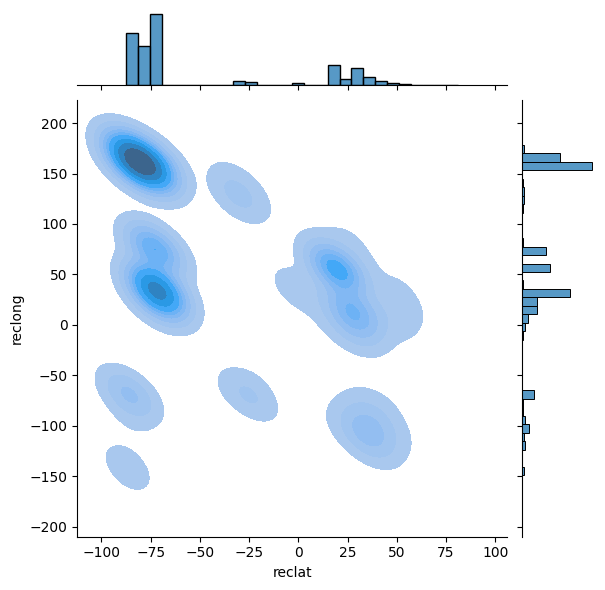

In [38]:
g = sb.JointGrid(data=df, x="reclat", y="reclong")
g.plot(sb.kdeplot, sb.histplot, fill = True)

As appears from the joint graph above. Most meteorites fall in the east below the equator. Let's look at the percentage.

<Axes: >

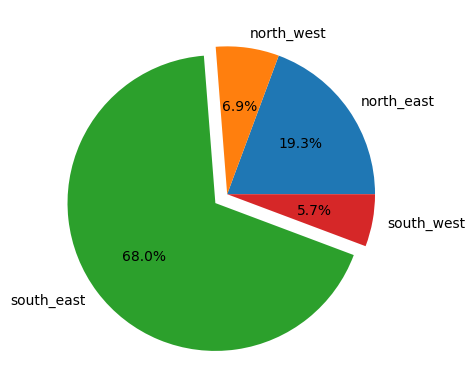

In [39]:
north_east  = df[(df['reclat'] >0) & (df['reclong'] >0)].shape[0]
north_west = df[(df['reclat'] >0) &(df['reclong'] <0)].shape[0]
south_east  = df[(df['reclat'] <0) &(df['reclong'] >0)].shape[0]
south_west  = df[(df['reclat'] <0) &(df['reclong'] <0)].shape[0]
pd.Series([north_east,north_west,south_east,south_west], index = ['north_east','north_west','south_east','south_west']).plot.pie(explode=(0, 0, 0.10,  0), autopct='%1.1f%%')

~68% of the meteorites fall in the south east.

But let's see where the heaviest meteorites fall.

In [41]:
df['umbrella'] = df['recclass'].str.split(',', expand = True)[0]

In [42]:
df.sort_values(by = 'mass', ascending = False)[:100]

,name,id,nametype,recclass,mass,fall,year,reclat,reclong,umbrella
16392,Hoba,11890,Valid,"Iron, IVB",60000.0,Found,1920.0,-19.58333,17.91667,Iron
5373,Cape York,5262,Valid,"Iron, IIIAB",58200.0,Found,1818.0,76.13333,-64.93333,Iron
5365,Campo del Cielo,5247,Valid,"Iron, IAB-MG",50000.0,Found,1575.0,-27.46667,-60.58333,Iron
5370,Canyon Diablo,5257,Valid,"Iron, IAB-MG",30000.0,Found,1891.0,35.05000,-111.03333,Iron
3455,Armanty,2335,Valid,"Iron, IIIE",28000.0,Found,1898.0,47.00000,88.00000,Iron
...,...,...,...,...,...,...,...,...,...,...
45662,Yanhuitlan,30349,Valid,"Iron, IVA",421.0,Found,1825.0,17.53333,-97.35000,Iron
760,Paragould,18101,Valid,LL5,408.0,Fell,1930.0,36.06667,-90.50000,LL5
2440,Allan Hills A76009,1316,Valid,L6,407.0,Found,1976.0,-76.71667,159.66667,L6
31979,Pei Xian,18784,Valid,Iron,400.0,Found,1917.0,34.70000,117.00000,Iron


First of it appears that the heaviest meteorites are from Iron class. Lets see from the top 100 heaviest meteorites heo many are in the Iron class.

In [43]:
df.sort_values(by = 'mass', ascending = False)[:100][df['umbrella']=='Iron'].shape[0]

C:\Users\Jay\AppData\Local\Temp\ipykernel_2304\298858807.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df.sort_values(by = 'mass', ascending = False)[:100][df['umbrella']=='Iron'].shape[0]


73

73% from the top heavist meteorites are in the Iron class

In [44]:
(df[df['umbrella']=='Iron'].shape[0]/df.shape[0])*100

2.9064486830154403

while Iron clss meteorites make only ~3% of the total meteorite fell or found on Earth. According to wikipedia: 'Iron meteorites, also known as siderites, or ferrous meteorites, are a type of meteorite that consist overwhelmingly of an iron–nickel alloy known as meteoric iron that usually consists of two mineral phases: kamacite and taenite. Most iron meteorites originate from cores of planetesimals, with the exception of the IIE iron meteorite group.

The iron found in iron meteorites was one of the earliest sources of usable iron available to humans, due to the malleability and ductility of the meteoric iron, before the development of smelting that signaled the beginning of the Iron Age'

But.... where do they fall?

Fun fact: "Meteorites are rarer than gold, platinum, diamonds or emeralds and 1 pound could be worth $1 million"

In [31]:
# Create an interactive map plot with circles sized by mass
fig = px.scatter_geo(df, 
                     lat='latitude', 
                     lon='longitude', 
                     size='mass', 
                     hover_name='name', 
                     color='mass',
                     title='Meteorites by Mass and Location',
                     labels={'mass': 'Mass (kg)'}, 
                     projection='natural earth',
                     color_continuous_scale='YlOrRd')  # Yellow to Red color scale

# Update layout to improve visualization
fig.update_layout(
    geo=dict(
        showland=True,
        landcolor='rgb(217, 217, 217)',
    ),
    autosize=False,
    width=1000,
    height=600
)

# To display the plot in a Jupyter notebook, use the following:
fig.show()

In [32]:
# Create an interactive map plot with different colors for 'Fell' and 'Found'
fig = px.scatter_geo(df, 
                     lat='latitude', 
                     lon='longitude', 
                     hover_name='name', 
                     color='fall',
                     title='Meteorites by Fall and Find',
                     labels={'fall': 'Meteorite Type'}, 
                     projection='natural earth',
                     color_discrete_map={'Fell': 'red', 'Found': 'blue'})

# Update layout to improve visualization
fig.update_layout(
    geo=dict(
        showland=True,
        landcolor='rgb(217, 217, 217)',
    ),
    autosize=False,
    width=1000,
    height=600
)

# To display the plot in a Jupyter notebook, use the following:
fig.show()

In [36]:
# Define Nepal's geographical boundaries
nepal_lat_min = 26.347
nepal_lat_max = 30.422
nepal_lon_min = 80.058
nepal_lon_max = 88.201

# Filter the dataset for entries within Nepal's boundaries
nepal_meteorites = df[(df['latitude'] >= nepal_lat_min) &
                                  (df['latitude'] <= nepal_lat_max) &
                                  (df['longitude'] >= nepal_lon_min) &
                                  (df['longitude'] <= nepal_lon_max)]

# Create a map plot of meteorites that fell in Nepal using Mapbox
fig = px.scatter_mapbox(nepal_meteorites, 
                        lat='latitude', 
                        lon='longitude', 
                        hover_name='name', 
                        size='mass',
                        title='Meteorites that Fell in Nepal',
                        labels={'mass': 'Mass (kg)'}, 
                        color_discrete_sequence=['red'],  # Set the color of points to black
                        size_max=10,
                        zoom=6)

# Update layout to use Mapbox
fig.update_layout(
    mapbox_style='open-street-map',
    mapbox_center={'lat': 28.3949, 'lon': 84.1240},
    autosize=False,
    width=1000,
    height=600
)

# Display the plot in a Jupyter notebook
fig.show()

In [35]:
# Define India's geographical boundaries
india_lat_min = 6.7535159
india_lat_max = 35.6745457
india_lon_min = 68.162386
india_lon_max = 97.415787

# Filter the dataset for entries within India's boundaries
india_meteorites = df[(df['latitude'] >= india_lat_min) &
                                  (df['latitude'] <= india_lat_max) &
                                  (df['longitude'] >= india_lon_min) &
                                  (df['longitude'] <= india_lon_max)]

# Create a map plot of meteorites that fell in India using Mapbox
fig = px.scatter_mapbox(india_meteorites, 
                        lat='latitude', 
                        lon='longitude', 
                        hover_name='name', 
                        size='mass',
                        title='Meteorites that Fell in India',
                        labels={'mass': 'Mass (kg)'}, 
                        color_discrete_sequence=['red'],  # Set the color of points to black
                        size_max=10,
                        zoom=4)

# Update layout to use Mapbox
fig.update_layout(
    mapbox_style='open-street-map',
    mapbox_center={'lat': 20.5937, 'lon': 78.9629},  # Center the map on India
    autosize=False,
    width=1000,
    height=600
)

# Display the plot in a Jupyter notebook
fig.show()


In [37]:
# Sort the dataset by mass in descending order and select the top 10 entries
top_10_meteorites = df.nlargest(10, 'mass')

# Create a map plot of the top 10 meteorites by mass using Mapbox
fig = px.scatter_mapbox(top_10_meteorites, 
                        lat='latitude', 
                        lon='longitude', 
                        hover_name='name', 
                        size='mass',
                        title='Top 10 Meteorites by Mass',
                        labels={'mass': 'Mass (kg)'}, 
                        color='mass',  # Color points by mass
                        color_continuous_scale='YlOrRd',  # Use a color scale from yellow to red
                        size_max=30,
                        zoom=1,
                        hover_data={
                            'year': True,
                            'fall':True,
                            'class': True,
                            'latitude': True,
                            'longitude': True,
                            'mass': True,
                            'class':True
                        })

# Update layout to use Mapbox
fig.update_layout(
    mapbox_style='open-street-map',
    mapbox_center={'lat': 0, 'lon': 0},  # Center the map globally
    autosize=False,
    width=1000,
    height=600
)

# Display the plot in a Jupyter notebook
fig.show()


In [38]:
fig = px.scatter_geo(df, lat="latitude", lon="longitude", 
                     color="year", hover_name="name", 
                     projection="natural earth", size="mass",
                    size_max=50, color_continuous_scale=px.colors.sequential.Turbo,
                     range_color=[1500, 2023], title="Meteorites Impacting Earth 1500-2023")
fig.show()

In [39]:
# Create maps that present where the Meteorites landed and their mass.
fig = px.scatter_geo(df, lat='latitude', lon='longitude', color='mass',
                     hover_data=['latitude', 'longitude', 'mass'], animation_frame='year')
fig.show()